# **Giới thiệu**

## **Thông tin nhóm**
- 1612106 - Nguyễn Nhật Dinh
- 18120249 - Hồ Minh Trí
- 19120543 - Hoàng Mạnh Khiêm

## **Mô tả đề tài**
**ĐỀ TÀI:** THAY ĐỔI NỀN ẢNH VỚI PHƯƠNG PHÁP POISSON MATTING

**Input:**
- Ảnh gốc cần thay đổi nền.
- Tri-map của ảnh cần thay đổi nền.
- Nền ảnh mới mong muốn thay đổi.

**Output:** Ảnh mới với nền đã được thay đổi theo mong muốn.

**Ý nghĩa:**
- Ứng dụng trong các trường hợp cần thay đổi nền ảnh khi cần thiết (Zoom, v.v.).
- Dùng trong các phần mềm chỉnh sửa ảnh hoặc video.

**Lý do cần song song hóa:** Việc song song hóa sẽ giúp tăng tốc độ thực hiện, giảm thời gian xử lý, và cải thiện trải
nghiệm người dùng khi sử dụng các công cụ thay đổi nền.

**Tham khảo:**
- [Paper về Poisson matting.](https://www.cs.jhu.edu/~misha/Fall07/Papers/Sun04.pdf)

- Nguồn tham khảo source:
    + [GitHub - MarcoForte/poisson-matting: Python implementation of Poisson
matting method.](https://github.com/MarcoForte/poisson-matting)
    + [GitHub - avani17101/Poisson-Matting](https://github.com/avani17101/Poisson-Matting)



# **Import**

# **Cài đặt giải thuật**

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy import ndimage
import timeit
from numba import jit, cuda
import math

## **Các bước thực hiện**

### **Global Matting**
- **Bước 1:** Xác định phần **Foreground(F)** và **Background(B)** từ **Tri-map** và **ảnh xám** của ảnh đầu vào. Khởi tạo **alpha matte(𝛼)**.
    + Từ ảnh **Tri-map** xác định các **mask** của **Foreground**, **Background** và **Unknown**:
        + **Foreground Mask:** có giá trị **> 245**
        + **Background Mask:** có giá trị **< 10**
        + **Unknown Mask:** có giá trị **>= 10** và **<= 50**
    + Xác định **F** và **B** từ **ảnh xám** và các **mask** đã xác định bên trên:
        + **F = Grayscale * (Foreground Mask + Unknown Mask)**
        + **B = Grayscale * (Background Mask + Unknown Mask)** 
    + Khởi tạo 𝛼 = Foreground Mask + 0.5 * Unknown Mask

- **Bước 2:** Xác định và giải phương trình Poisson để xác định **alpha matte(𝛼)**.
    + Phương trình Poisson:

    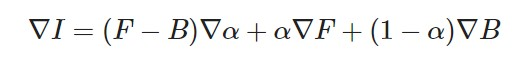

    Suy ra:

    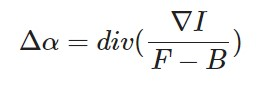

    + Phương trình Poisson sẽ được giải bằng phương pháp ước lượng Gauss Siedel Iteration để xấp xỉ được 𝛼 tốt nhất.

    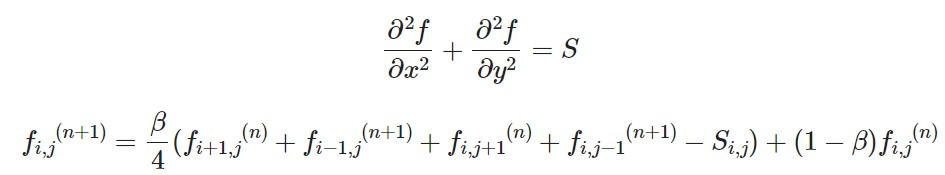

    Tính đạo hàm và sử dụng vòng lặp để có thể xấp xỉ **alpha matte(𝛼)** theo công thức trên.
+ **Bước 3:** Kết hợp **Ảnh đầu vào (Input Image)**, **Ảnh nền mới (Background Image)** và **alpha matte(𝛼)** để tạo ra ảnh mới với nền đã được thay đổi.

        Result = 𝛼 * Input Image + (1 - 𝛼) * Background Image

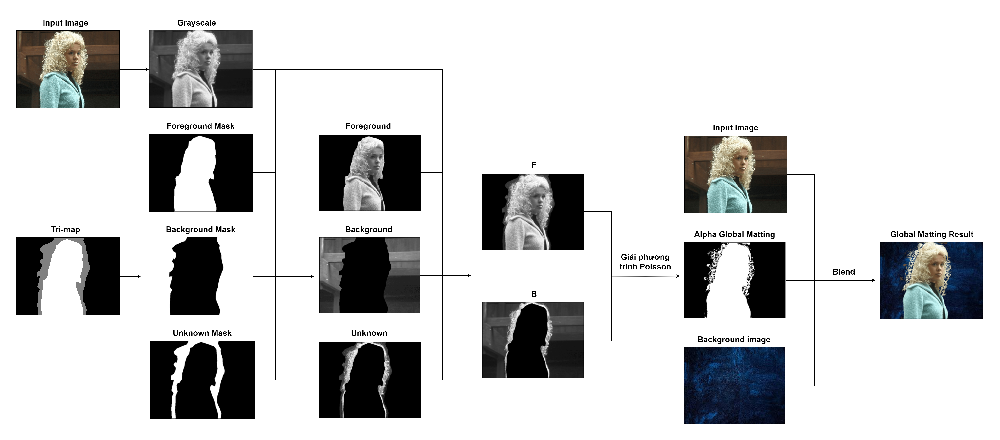

### **Local Matting**
- **Bước 1:** Từ kết quả thu được sau khi thực hiện kết hợp **Ảnh đầu vào (Input Image)**, **Ảnh nền mới (Background Image)** và **alpha matte(𝛼)** để tạo ra ảnh mới, tiến hành xác định các khu vực cần cải thiện.

- **Bước 2:** Thực hiện Local Matting trên khu vực cần cải thiện để xác định **Local Matte**. Bản chất của Local Matting là Global Matting nhưng trên khu vực nhỏ hơn.

- **Bước 3:** Kết hợp **Foreground(F)**, **Background(B)** và **Local Matte** để tạo ra ảnh mới với nền đã được thay đổi và đã được cải thiện.

Có thể thực hiện lặp lại nhiều lần cho đến khi không còn khu vực cần cải thiện.

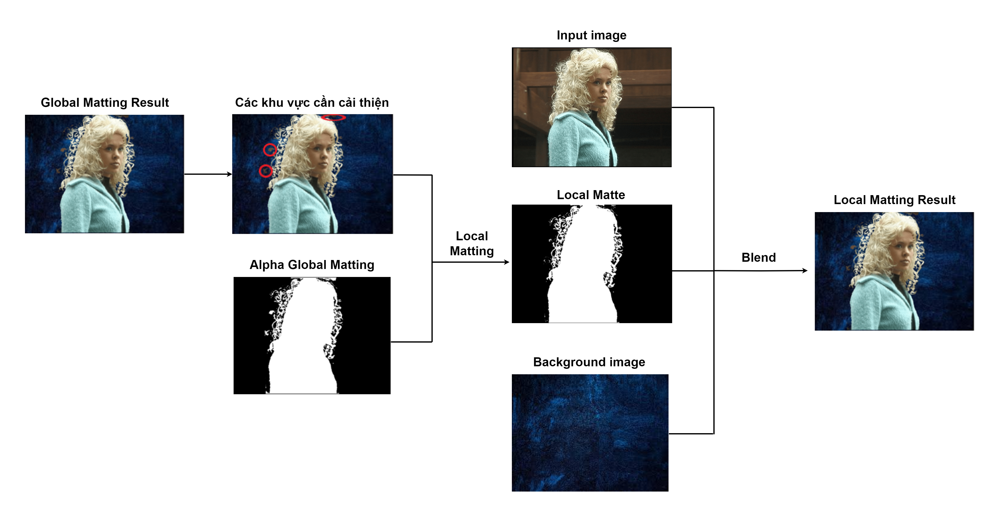

## **Hàm hỗ trợ** 

In [ ]:
def show_imgs(imgs, img_titles, nrows, ncols, figure_size):
    fig, ax = plt.subplots(nrows= nrows, ncols= ncols, figsize= figure_size)
    ax = ax.flatten()

    for i in range(len(imgs)):
        ax[i].imshow(imgs[i], cmap = 'gray')
        ax[i].set_title(img_titles[i])

    plt.show()

## **Đọc ảnh đầu vào**

In [ ]:
!gdown https://drive.google.com/drive/folders/1MicpE5vGxsOUZK2Gf4nT7UnMur-Yp3Zu?usp=sharing -O /content/input --folder

Retrieving folder list
Processing file 1afffCmsFISQSpRKZtnOHimgTtXCDDfnq background_img.jpg
Processing file 1bfgzd7kf7ZXLf9bpr1uzi56PSIIeGTBR input_img.png
Processing file 1pSU9Q--pB_fCUOn-7Q-mAOcljBirN6Sq trimap.png
Retrieving folder list completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1afffCmsFISQSpRKZtnOHimgTtXCDDfnq
To: /content/input/background_img.jpg
100% 7.04k/7.04k [00:00<00:00, 38.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1bfgzd7kf7ZXLf9bpr1uzi56PSIIeGTBR
To: /content/input/input_img.png
100% 176k/176k [00:00<00:00, 140MB/s]
Downloading...
From: https://drive.google.com/uc?id=1pSU9Q--pB_fCUOn-7Q-mAOcljBirN6Sq
To: /content/input/trimap.png
100% 1.80k/1.80k [00:00<00:00, 13.2MB/s]
Download completed


In [ ]:
input_img = cv2.imread('/content/input/input_img.png')
input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2RGB)

grayscale_img = cv2.imread('/content/input/input_img.png', 0)

trimap = cv2.imread('/content/input/trimap.png', 0)

background_img = cv2.imread('/content/input/background_img.jpg')
background_img = cv2.cvtColor(background_img, cv2.COLOR_BGR2RGB)
background_img = cv2.resize(background_img, (input_img.shape[1],input_img.shape[0])) 

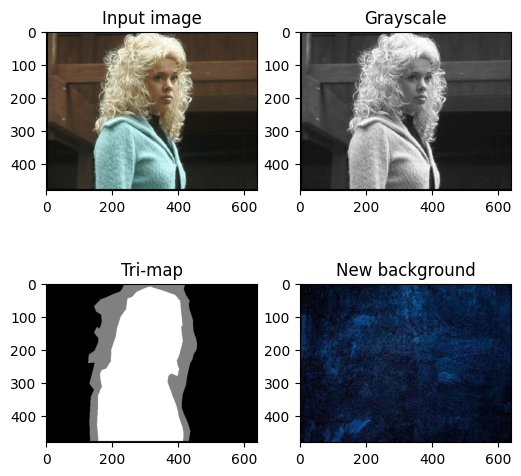

In [ ]:
img_titles = ['Input image', 'Grayscale', 'Tri-map', 'New background']
imgs = [input_img, grayscale_img, trimap, background_img]

show_imgs(imgs, img_titles, 2, 2, (6, 6))

## **Cài đặt tuần tự**

**Quy trình thực hiện:**
Ảnh đầu vào, tri-map và ảnh nền đã được đọc vào trước đó. Tiến hành tạo ảnh grayscale từ ảnh đầu vào. 
1. Thực thi hàm `matting_combined()` đây là hàm thực hiện chủ yếu các bước trong Global Matting gồm:
    - Xác định **F**, **B**, khởi tạo **𝛼** các giá trị gradient của **𝛼** qua việc gọi hàm `estimate_alpha`. `estimate_alpha` sẽ gọi các hàm `calculate_mask`, `calculate_FB` và `grad` để thực hiện các tính toán trên.

    - `global_alpha_matting` sẽ được gọi để thực hiện xấp xỉ **𝛼** bằng cách giải phương trình Poisson.

2. Thực thi hàm `alpha_blend` kết hợp **ảnh đầu vào**, **ảnh nền mới** và **𝛼** thu được bên trên để tạo ra ảnh mới với nền đã được thay đổi.

3. Từ kết quả thu được bên trên tiến hành xác định các khu vực cần cải thiện. Thực hiện các bước bên dưới nếu có các khu vực cần được cải thiện. Các khu vực cải thiện sẽ được quan sát từ kết quả của Global Matting và thiết lập sẵn.

4. Thực hiện Local Matting trên các khu vực cần được cải thiện. 
    - Tính toán Local Matte trên khu vực cần cải thiện nhờ hàm `calculate_local_matte` 

    - Thực thi hàm `alpha_blend` kết hợp **ảnh đầu vào**, **ảnh nền mới** và **𝛼** thu được bên trên để tạo ra ảnh mới với nền đã được thay đổi và cải thiện.

Hàm thực thi phần tuần tự là `sequential_poisson_matting`. Kết quả và thời gian thực thi sẽ được in ra màn hình.


### **Global Matting**

In [ ]:
# Xây dựng các mask và tách các vùng Foreground, Background và Unknown
def calculate_mask(trimap, grayscale_img):
    mask_foreground = (trimap > 245)
    mask_background = (trimap < 10)
    mask_unknown = ((trimap >= 10) & (trimap <= 245))

    foreground = grayscale_img * mask_foreground
    background = grayscale_img * mask_background
    unknown = grayscale_img * mask_unknown

    return mask_foreground, foreground, mask_background, background, mask_unknown, unknown

# Tính đạo hàm bậc 2 cho phương trình Poisson
def double_differential(grayscale_img, factor):
    dy, dx = np.gradient(grayscale_img)
    d2y, _ = np.gradient(dy / factor)
    _, d2x = np.gradient(dx / factor)

    return d2y, d2x

 # Xác định vùng Foreground, Background
def calculate_FB(grayscale_img, mask_foreground, mask_background, mask_unknown):   
    F = grayscale_img * (mask_foreground + mask_unknown)
    B = grayscale_img * (mask_background + mask_unknown)
    return F, B

# Thực thi Global alpha matting
def global_alpha_matting(alpha, d2alpha, unknown, n= 50, threshold= 0.1, b= 1):
    new_alpha = alpha.copy()
    old_alpha = np.zeros(alpha.shape)
    
    for _ in range(n):
        diff = np.sum(np.abs(old_alpha - new_alpha))
        if diff < threshold: break

        old_alpha = new_alpha.copy()
        for i in range(1, alpha.shape[0] - 1):
            for j in range(1, alpha.shape[1] - 1):
                if unknown[i, j] != 0 :
                    new_alpha[i, j] = (b / 4 * (new_alpha[i, j - 1] + new_alpha[i - 1, j] + old_alpha[i, j + 1] + old_alpha[i + 1, j] - d2alpha[i, j])) + ((1 - b) * old_alpha[i, j])
    return new_alpha

# Tính Gradient
def grad(grayscale_img, F, B, mask_foreground, mask_unknown):
    diff = np.minimum(np.maximum(F - B, 0), 255)

    diff = ndimage.gaussian_filter(diff, 0.9)
    diff = np.minimum(np.maximum(diff, 0), 255)
    grad_y, grad_x = np.gradient(grayscale_img)

    diff[diff == 0] = 1
    d2y_alpha, _ = np.gradient(grad_y / diff)
    _, d2x_alpha = np.gradient(grad_x / diff)
    d2alpha = d2y_alpha + d2x_alpha
    estimate_alpha = mask_foreground + 0.5 * mask_unknown

    return estimate_alpha, d2alpha, diff

# Xấp xỉ alpha
def estimate_alpha(trimap, grayscale_img):
    mask_foreground, foreground, mask_background, background, mask_unknown, unknown = calculate_mask(trimap, grayscale_img)
    
    F, B = calculate_FB(grayscale_img, mask_foreground, mask_background, mask_unknown)
    est_alpha, d2alpha, diff =  grad(grayscale_img, F, B, mask_foreground, mask_unknown)

    return est_alpha, F, B, d2alpha, mask_foreground, foreground, mask_background, background, mask_unknown, unknown, diff

# Tổng hợp alpha
def matting_combined(trimap, grayscale_img):  
    est_alpha, F, B, d2alpha, mask_foreground, foreground, mask_background, background, mask_unknown, unknown, diff = estimate_alpha(trimap, grayscale_img)
    alpha = global_alpha_matting(est_alpha, d2alpha, mask_unknown)
    alpha = np.minimum(np.maximum(alpha, 0), 1)

    return {'Mask_foreground': mask_foreground, 'Foreground': foreground,
            'Mask_background': mask_background, 'Background': background,
            'Mask_unknown': mask_unknown, 'Unknown': unknown,
            'F': F, 'B': B,
            'Alpha': alpha}, diff

# Kết hợp alpha, ảnh đầu vào và nền ảnh để thu được ảnh với nền mới
def alpha_blend(input_img, background_img, alpha):
    result = np.zeros(background_img.shape)
    result[:, :, 0] = alpha * input_img[:, :, 0] + (1 - alpha) * background_img[:, : ,0]
    result[:, :, 1] = alpha * input_img[:, :, 1] + (1 - alpha) * background_img[:, : ,1]
    result[:, :, 2] = alpha * input_img[:, :, 2] + (1 - alpha) * background_img[:, :, 2]

    return np.int64(result)

# Hàm thực thi Global Matting
def global_matting(input_img, grayscale_img, trimap, background_img):
    global_matte, diff = matting_combined(trimap, grayscale_img)
    result = alpha_blend(input_img, background_img, global_matte['Alpha'])

    return result, global_matte, diff

### **Local matting**

In [ ]:
# Cải thiện chất lượng xử lý với khu vực cần cải thiện được cung cấp
def calculate_local_matte(grayscale_img, imgs, top, bottom, left, right, diff):
    h, w = imgs['Alpha'].shape[0], imgs['Alpha'].shape[1]
    local = False
    if('Local_matte' in imgs.keys()):
        local = True
        h, w = imgs['Local_matte'].shape[0], imgs['Local_matte'].shape[1]
        
    new_diff = diff[top:bottom+1, left:right + 1]
    
    # Đặt Gaussian filter
    new_diff = ndimage.gaussian_filter(new_diff, 0.9)
    new_diff = np.minimum(np.maximum(new_diff, 0), 255)
    
    # Xác định phần cần cải thiện trên ảnh xám, F, B, vùng Unknown và Alpha
    required_img = grayscale_img.copy()[top:bottom + 1, left:right + 1]
    required_foreground = imgs['F'].copy()[top:bottom + 1, left:right + 1]
    required_background = imgs['B'].copy()[top:bottom + 1, left:right + 1]
    required_unknown = imgs['Unknown'].copy()[top:bottom, left:right]
    required_alpha= imgs['Alpha'].copy()[top:bottom + 1, left:right + 1]
    if(local == True):
        required_alpha= imgs['Local_matte'].copy()[top:bottom + 1, left:right + 1]
    
    required_inverted_alpha = 1 - required_alpha
    required_mask_unknown = imgs['Mask_unknown'].copy()[top:bottom+1, left:right+1]
    
    # Lấy đạo hàm bậc 2
    foreground_d2y, foreground_d2x = double_differential(required_foreground, new_diff)
    background_d2y, background_d2x = double_differential(required_background, new_diff)
    img_d2y, img_d2x = double_differential(required_img, new_diff)
    weighted_foreground = required_alpha * (foreground_d2x + foreground_d2y)
    weighted_background = required_alpha * (background_d2x + background_d2y)
    new_d2alpha = img_d2x + img_d2y - weighted_foreground - weighted_background
    
    local_matte = global_alpha_matting(required_alpha, new_d2alpha, required_mask_unknown, n= 50, threshold= 0.1, b= 0.2)
    local_matte = np.minimum(np.maximum(local_matte, 0), 1)

    return local_matte

# Hàm thực thi Local Matting với các khu vực được chỉ định cần cải thiện(coordinates)
def local_matting(input_img, grayscale_img, background_img, coordinates, imgs, diff):
    local_matte =  imgs['Alpha'].copy()

    for coord in coordinates:
        top = coord['Top']
        bottom = coord['Bottom']
        left = coord['Left']
        right = coord['Right']
        local_matte[top:bottom + 1, left:right + 1] = calculate_local_matte(grayscale_img, imgs.copy(), top, bottom, left, right, diff)

    local_matte = np.minimum(np.maximum(local_matte, 0), 1)

    result = alpha_blend(input_img, background_img, local_matte)

    return result, local_matte

In [ ]:
# Hàm thực thi cài đặt tuần tự
def sequential_poisson_matting(input_img, grayscale_img, trimap, background_img, coordinates):
    global_result, imgs, diff = global_matting(input_img, grayscale_img, trimap, background_img)
    imgs['Global matting result'] = global_result

    local_result, local_matte = local_matting(input_img, grayscale_img, background_img, coordinates, imgs, diff)

    imgs['Local matte'] = local_matte
    imgs['Local matting result'] = local_result
    
    return imgs

In [ ]:
# Vị trí các khu vực cần cải thiện
coordinates = [{'Top': 465, 'Bottom': 480, 'Left': 120, 'Right': 150},
               {'Top': 212, 'Bottom': 240, 'Left': 118, 'Right': 150},
               {'Top': 135, 'Bottom': 155, 'Left': 145, 'Right': 170},
               {'Top': 0, 'Bottom': 20, 'Left': 370, 'Right': 435}]

start_time = timeit.default_timer()
sequential_imgs = sequential_poisson_matting(input_img, grayscale_img, trimap, background_img, coordinates)
end_time = timeit.default_timer()
sequential_runtime = (end_time - start_time) * 1000
print(f'Sequential runtime: {sequential_runtime:.2f} ms')

Sequential runtime: 25957.85 ms


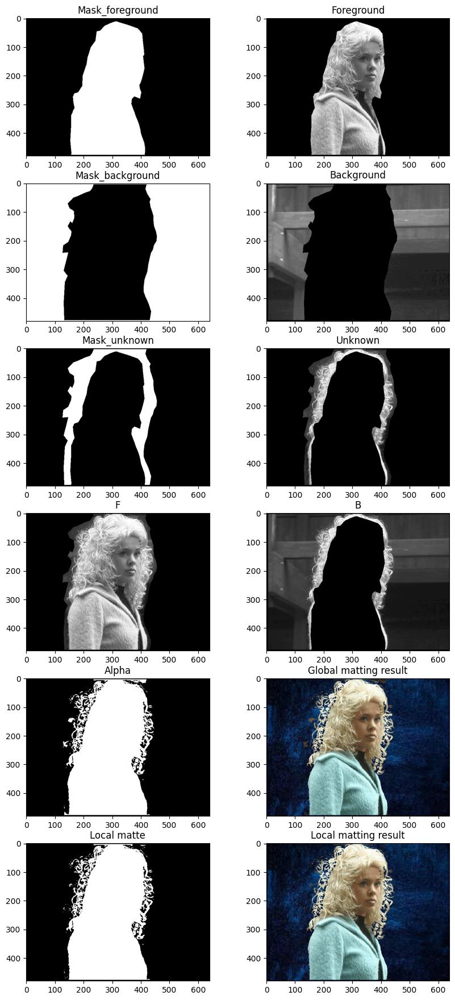

In [ ]:
img_titles = list(sequential_imgs.keys())
imgs = list(sequential_imgs.values())

show_imgs(imgs, img_titles, 6, 2, (10, 22))

## **Cài đặt song song**

**Phần thực hiện song song hóa**: Hàm tính toán alpha trong phần xử lý của global matting (hàm `global_alpha_matting`).

**Mô tả về hàm:** `global_alpha_matting`:

- **Mục đích:** Là hàm thực thi tính ra giá trị alpha cho xử lý global alpha matting

- **Parameters:**
    + **alpha:** giá trị xấp xỉ của alpha
    + **d2alpha:** tổng đạo hàm riêng bậc 2 của alpha theo X và Y
    + **unknown:** mảng numpy đại diện cho vùng chưa xác định rõ
    + **iters:** số lần chạy của phương pháp ước lượng Gauss Siedel
    + **threshold:** ngưỡng cho sự thay đổi sau mỗi lần chạy, Nếu dưới ngưỡng thì phương trình sẽ dừng lại
    + **b:** nhân tử beta của phương pháp ước lượng Gauss Siedel

- **Return:** Mảng numpy đại diện cho chỉ số matte đã được tạo

---

**Mô tả cách hoạt động của hàm:**

  - Sao chép **alpha** vào **new_alpha**.
  - Gán **old_alpha** là 1 ma trận không, có kích thước bằng với **alpha**.
  - Tính toán sự khác biệt giữa **old_alpha** và **new_alpha**.
  - Sử dụng vòng lặp với số lần lặp là **iters**
  - Tính độ khác biệt giữa **old_alpha** và **new_alpha**. Nếu nhỏ hơn **threshold** thì kết thúc
  - Chạy 2 vòng lặp for lần lượt duyệt qua từng pixel của **alpha**
  - Tính lại giá trị của từng pixel theo công thức từ **beta**, **alpha**, **old_alpha**, **d2alpha**

=> Nhóm dự định tiến hành song song hóa ở bước tính giá trị pixel theo công thức, cách thực hiện là chia cho mỗi thread đảm nhận một pixel để tính lại giá trị của alpha.

---

**Quy trình thực hiện:** Tương tự với phần cài đặt tuần tự chỉ thay thế một số hàm tuần tự bằng các hàm cài đặt song song. 

In [ ]:
@cuda.jit
def compute_alpha_kernel(alpha, b, old_alpha, d2alpha, unknown):
    """
    Hàm tính toán giá trị alpha dựa trên các tham số đầu vào

    Parameters:
      alpha: giá trị xấp xỉ của alpha
      b: nhân tử beta của phương pháp ước lượng Gauss Siedel
      old_alpha: ma trận không, có kích thước bằng với alpha
      d2alpha: tổng đạo hàm riêng bậc 2 của alpha theo X và Y
      unknown: mảng numpy đại diện cho vùng chưa xác định rõ
    
    """
    # lấy thông tin thread hiện tại
    r, c = cuda.grid(2)

    # Kiểm tra vị trí hiện tại có thuộc alpha hay không
    if (r < alpha.shape[0] and r > 0) and (c < alpha.shape[1] and c > 0): 
        # Giá trị của unknown tại vùng unknown sẽ > 0, khi đó ta sẽ tính toán lại bằng Gauss Siedel
        if unknown[r, c] != 0 : 
            alpha[r, c] = (b / 4 * (alpha[r, c - 1] + alpha[r - 1, c] + old_alpha[r, c + 1] + old_alpha[r + 1, c] - d2alpha[r, c])) + ((1 - b) * old_alpha[r, c])

In [ ]:
def global_alpha_matting_kernel(alpha, d2alpha, unknown, width, height, iters = 50, threshold = 0.1, b = 1):
    """
    Hàm thực thi global alpha matting trên kernel

    Parameters:
    -----------
    alpha: giá trị xấp xỉ của alpha
    d2alpha: tổng đạo hàm riêng bậc 2 của alpha theo X và Y
    unknown: mảng numpy đại diện cho vùng chưa xác định rõ
    iters: số lần chạy của phương pháp ước lượng Gauss Siedel
    threshold: ngưỡng cho sự thay đổi sau mỗi lần chạy. Nếu dưới ngưỡng thì phương trình sẽ dừng lại
    b: nhân tử beta của phương pháp ước lượng Gauss Siedel
    Return:
    -----------
    Mảng numpy đại diện cho chỉ số matte đã được tạo
    """
    new_alpha = alpha.copy()
    old_alpha = np.zeros(alpha.shape)
    abs_diff_matrix = np.zeros(alpha.shape)

    block_size = (32, 32)
    grid_size = (math.ceil(height / block_size[0]), math.ceil(width / block_size[1]))

    # Sao chép các tham số sang GPU
    d_old_alpha = cuda.to_device(old_alpha)
    d_new_alpha = cuda.to_device(new_alpha)
    d_d2alpha = cuda.to_device(d2alpha)
    d_unknown = cuda.to_device(unknown)
    d_abs_diff_matrix = cuda.to_device(abs_diff_matrix)

    for _ in range(iters):
        # Lưu lại giá trị alpha
        d_old_alpha = d_new_alpha

        # Tính toán giá trị alpha bằng hàm compute_alpha_kernel
        compute_alpha_kernel[grid_size, block_size](d_new_alpha, b, d_old_alpha, d_d2alpha, d_unknown)

    # Sao chép giá trị alpha từ GPU về CPU và trả về kết quả
    new_alpha = d_new_alpha.copy_to_host()
    
    return new_alpha

In [ ]:
# Chỉnh sửa các hàm để sử dụng cùng hàm global_alpha_matting_kernel

# Tổng hợp alpha
def matting_combined_parallel(trimap, grayscale_img):  
    est_alpha, F, B, d2alpha, mask_foreground, foreground, mask_background, background, mask_unknown, unknown, diff = estimate_alpha(trimap, grayscale_img)

    alpha = global_alpha_matting_kernel(est_alpha, d2alpha, mask_unknown, est_alpha.shape[1], est_alpha.shape[0])
    alpha = np.minimum(np.maximum(alpha, 0), 1)

    return {'Mask_foreground': mask_foreground, 'Foreground': foreground,
            'Mask_background': mask_background, 'Background': background,
            'Mask_unknown': mask_unknown, 'Unknown': unknown,
            'F': F, 'B': B,
            'Alpha': alpha}, diff

# Hàm thực thi Global Matting
def global_matting_parallel(input_img, grayscale_img, trimap, background_img):
    global_matte, diff = matting_combined_parallel(trimap, grayscale_img)
    result = alpha_blend(input_img, background_img, global_matte['Alpha'])

    return result, global_matte, diff

# Hàm thực thi cài đặt song song 
def parallel_poisson_matting(input_img, grayscale_img, trimap, background_img, coordinates):
    global_result, imgs, diff = global_matting_parallel(input_img, grayscale_img, trimap, background_img)
    imgs['Global matting result'] = global_result

    local_result, local_matte = local_matting(input_img, grayscale_img, background_img, coordinates, imgs, diff)

    imgs['Local matte'] = local_matte
    imgs['Local matting result'] = local_result  
    
    return imgs

In [ ]:
# Vị trí các khu vực cần cải thiện
coordinates = [{'Top': 390, 'Bottom': 480, 'Left': 110, 'Right': 145},
               {'Top': 212, 'Bottom': 240, 'Left': 118, 'Right': 150},
               {'Top': 135, 'Bottom': 155, 'Left': 145, 'Right': 170},
               {'Top': 0, 'Bottom': 20, 'Left': 370, 'Right': 435}]

start_time = timeit.default_timer()
parallel_imgs = parallel_poisson_matting(input_img, grayscale_img, trimap, background_img, coordinates)
end_time = timeit.default_timer()
parallel_runtime = (end_time - start_time) * 1000
print(f'Parallel runtime: {parallel_runtime:.2f} ms')

Parallel runtime: 1269.35 ms


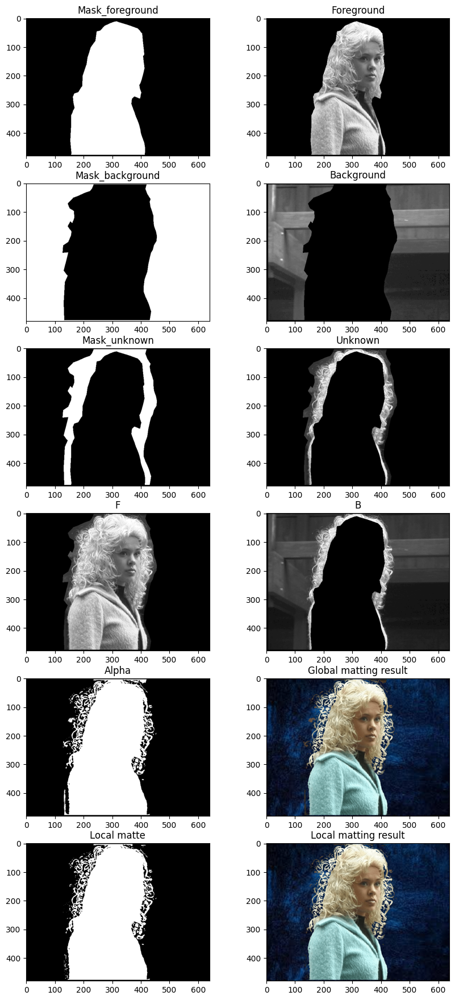

In [ ]:
img_titles = list(parallel_imgs.keys())
imgs = list(parallel_imgs.values())

show_imgs(imgs, img_titles, 6, 2, (10, 22))